In [119]:
!git clone https://github.com/Dreys-bot/Self-Driving-Cars


Cloning into 'Self-Driving-Cars'...
Updating files:   3% (406/12160)
Updating files:   4% (487/12160)
Updating files:   5% (608/12160)
Updating files:   6% (730/12160)
Updating files:   6% (780/12160)
Updating files:   7% (852/12160)
Updating files:   8% (973/12160)
Updating files:   9% (1095/12160)
Updating files:   9% (1161/12160)
Updating files:  10% (1216/12160)
Updating files:  11% (1338/12160)
Updating files:  12% (1460/12160)
Updating files:  12% (1558/12160)
Updating files:  13% (1581/12160)
Updating files:  14% (1703/12160)
Updating files:  15% (1824/12160)
Updating files:  15% (1892/12160)
Updating files:  16% (1946/12160)
Updating files:  17% (2068/12160)
Updating files:  18% (2189/12160)
Updating files:  18% (2217/12160)
Updating files:  19% (2311/12160)
Updating files:  20% (2432/12160)
Updating files:  20% (2540/12160)
Updating files:  21% (2554/12160)
Updating files:  22% (2676/12160)
Updating files:  23% (2797/12160)
Updating files:  23% (2860/12160)
Updating files:  24

In [120]:
!pip install imgaug

In [121]:
!pip install tensorflow

In [122]:
!pip install opencv-python


In [123]:
import numpy as np
import matplotlib.pyplot as plt
from keras.optimizers import Adam
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

from tensorflow.keras.layers import Dense,Dropout,Activation, Flatten, Convolution2D, MaxPooling2D
import cv2
import pandas as pd
import random
import os
import ntpath
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
import matplotlib.image as mpimg
from imgaug import augmenters as iaa

In [124]:
datadir = "Self-Driving-Cars"
columns= ['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']
data = pd.read_csv(os.path.join(datadir, 'driving_log.csv'), names=columns)
pd.set_option("display.max_colwidth", -1)
data.head()

C:\Users\adjoupep\AppData\Local\Temp\ipykernel_6672\1118763512.py:4: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option("display.max_colwidth", -1)


,center,left,right,steering,throttle,reverse,speed
0,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_382.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_382.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_382.jpg,0.0,0.0,0.0,0.649786
1,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_670.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_670.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_670.jpg,0.0,0.0,0.0,0.627942
2,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_724.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_724.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_724.jpg,0.0,0.0,0.0,0.622910
3,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_792.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_792.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_792.jpg,0.0,0.0,0.0,0.619162
4,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_860.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_860.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_860.jpg,0.0,0.0,0.0,0.615438


In [125]:
#Define a function to remove the path in the name on the each line in dataset
def path_leaf(path):
  head, tail = ntpath.split(path)
  return tail

data['center'] = data['center'].apply(path_leaf)
data['left'] = data['left'].apply(path_leaf)
data['right'] = data['right'].apply(path_leaf)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2018_07_16_17_11_43_382.jpg,left_2018_07_16_17_11_43_382.jpg,right_2018_07_16_17_11_43_382.jpg,0.0,0.0,0.0,0.649786
1,center_2018_07_16_17_11_43_670.jpg,left_2018_07_16_17_11_43_670.jpg,right_2018_07_16_17_11_43_670.jpg,0.0,0.0,0.0,0.627942
2,center_2018_07_16_17_11_43_724.jpg,left_2018_07_16_17_11_43_724.jpg,right_2018_07_16_17_11_43_724.jpg,0.0,0.0,0.0,0.622910
3,center_2018_07_16_17_11_43_792.jpg,left_2018_07_16_17_11_43_792.jpg,right_2018_07_16_17_11_43_792.jpg,0.0,0.0,0.0,0.619162
4,center_2018_07_16_17_11_43_860.jpg,left_2018_07_16_17_11_43_860.jpg,right_2018_07_16_17_11_43_860.jpg,0.0,0.0,0.0,0.615438


In [126]:
data.shape

(4053, 7)

### Visualization of data

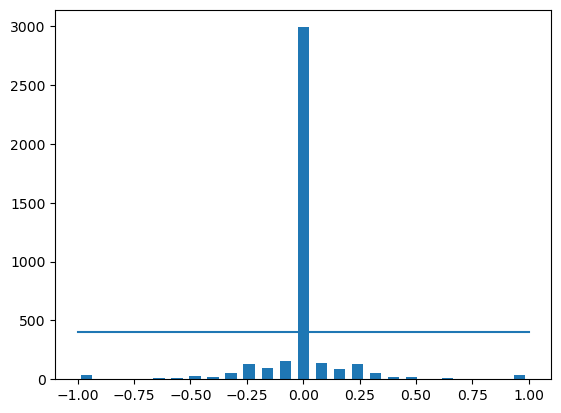

In [127]:
#We visualize our data to find the weakless of our data. Exemple: the frequent steering

num_bins = 25
samples_per_bin= 400
hist, bins = np.histogram(data['steering'], num_bins)
center = (bins[:-1] + bins[1:]) * 0.5
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

#### We notice that we have more steering=0 than other steering. It's because we were on the straight line in the most of the time. We have also the steering in the left and the right which means that, we have done as left steering as steering right

removed: 2590
remaining: 1463


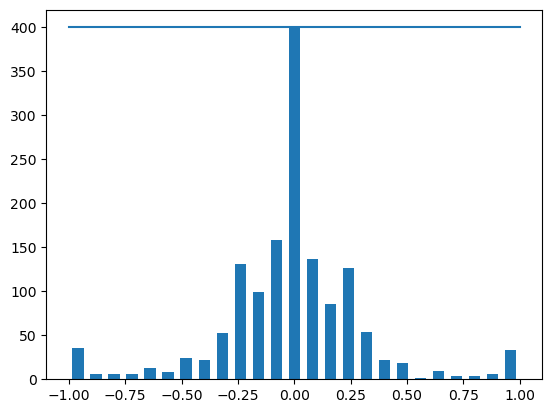

In [128]:
#We remove none importnant steering to have the important steering in the left and the right
remove_list = []
for j in range(num_bins):
  list_ = []
  for i in range(len(data['steering'])):
    if data['steering'][i] >= bins[j] and data['steering'][i] <= bins[j+1]:
      list_.append(i)
  list_ = shuffle(list_)
  list_ = list_[samples_per_bin:]
  remove_list.extend(list_)
 
print('removed:', len(remove_list))
data.drop(data.index[remove_list], inplace=True)
print('remaining:', len(data))
 
hist, _ = np.histogram(data['steering'], (num_bins))
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

In [129]:
print(data.iloc[1])
def load_img_steering(datadir, df):
  image_path = []
  steering = []
  for i in range(len(data)):
    indexed_data = data.iloc[i]
    center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
    image_path.append(os.path.join(datadir, center.strip()))
    steering.append(float(indexed_data[3]))
  image_paths = np.asarray(image_path)
  steerings = np.asarray(steering)
  return image_paths, steerings

image_paths, steerings = load_img_steering(datadir + '/IMG', data)

center      center_2018_07_16_17_11_44_413.jpg
left        left_2018_07_16_17_11_44_413.jpg  
right       right_2018_07_16_17_11_44_413.jpg 
steering   -0.05                              
throttle    0.642727                          
reverse     0.0                               
speed       1.434013                          
Name: 12, dtype: object


In [130]:
X_train, X_valid, Y_train, Y_valid = train_test_split(image_paths, steerings, test_size=0.2, random_state=6)
print('Training Samples: {}\nValid Samples: {}'.format(len(X_train), len(Y_train)))

Training Samples: 1170
Valid Samples: 1170


Text(0.5, 1.0, 'Validation set')

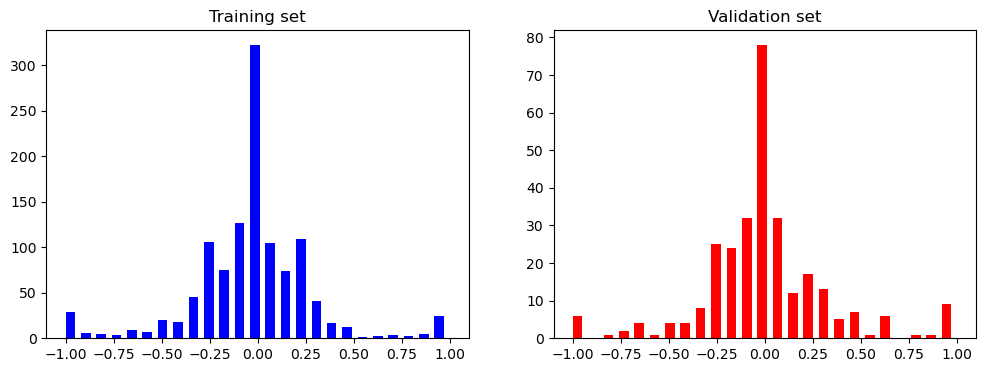

In [131]:
fig , axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(Y_train, bins=num_bins, width=0.05, color='blue')
axes[0].set_title('Training set')
axes[1].hist(Y_valid, bins=num_bins, width=0.05, color='red')
axes[1].set_title('Validation set')

In [132]:
def zoom(image):
    #zoom function
    zoom = iaa.Affine(scale=(1, 1.3))
    image = zoom.augment_image(image)
    return image

Text(0.5, 1.0, 'Zoomed Image')

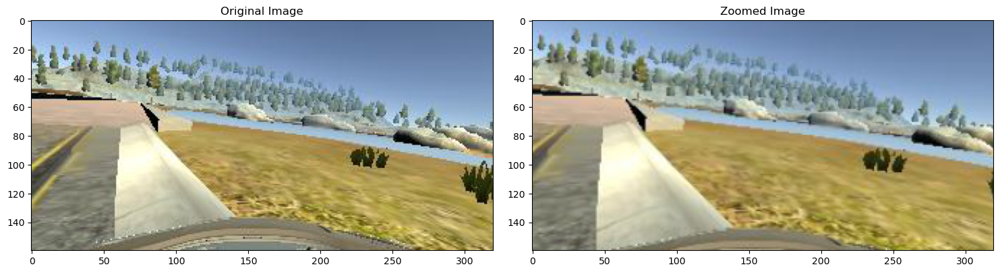

In [133]:
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
 
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
 
axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed Image')




In [134]:
def pan(image):
  pan = iaa.Affine(translate_percent= {"x" : (-0.1, 0.1), "y": (-0.1, 0.1)})
  image = pan.augment_image(image)
  return image


Text(0.5, 1.0, 'Panned Image')

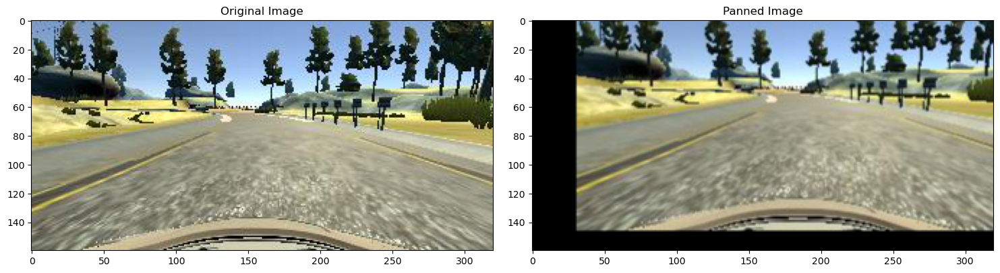

In [135]:
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
 
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
 
axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')


In [136]:
def img_random_brightness(image):
    brightness = iaa.Multiply((0.2, 1.2))
    image = brightness.augment_image(image)
    return image


Text(0.5, 1.0, 'Brightness altered image ')

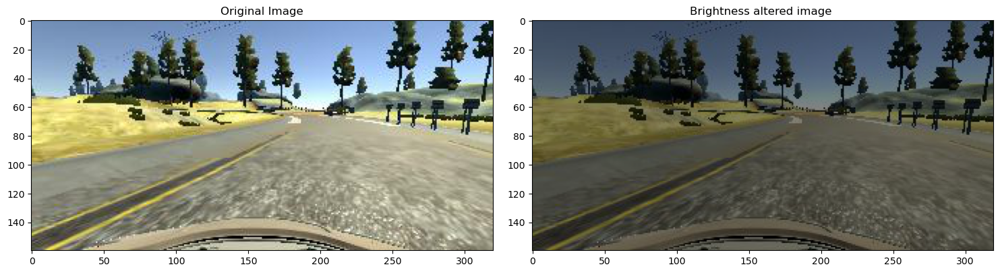

In [137]:
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
brightness_altered_image = img_random_brightness(original_image)
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
 
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
 
axs[1].imshow(brightness_altered_image)
axs[1].set_title('Brightness altered image ')




In [138]:
def img_random_flip(image, steering_angle):
    image = cv2.flip(image,1)
    steering_angle = -steering_angle
    return image, steering_angle


Text(0.5, 1.0, 'Flipped Image - Steering Angle:-0.2835037')

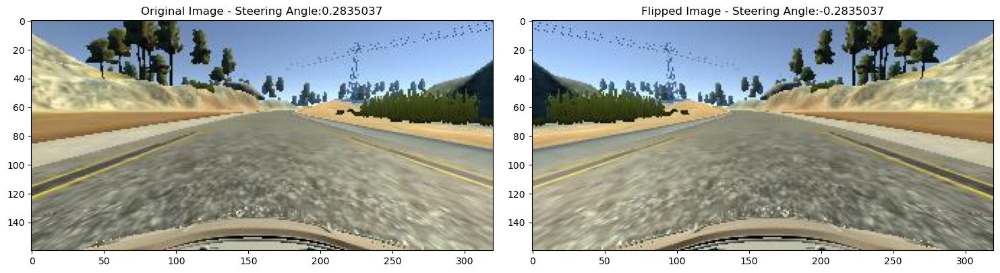

In [139]:
random_index = random.randint(0, 1000)
image = image_paths[random_index]
steering_angle = steerings[random_index]
 
 
original_image = mpimg.imread(image)
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
 
axs[0].imshow(original_image)
axs[0].set_title('Original Image - ' + 'Steering Angle:' + str(steering_angle))
 
axs[1].imshow(flipped_image)
axs[1].set_title('Flipped Image - ' + 'Steering Angle:' + str(flipped_steering_angle))


In [140]:
def random_augment(image, steering_angle):
    image = mpimg.imread(image)
    if np.random.rand() < 0.5:
      image = pan(image)
    if np.random.rand() < 0.5:
      image = zoom(image)
    if np.random.rand() < 0.5:
      image = img_random_brightness(image)
    if np.random.rand() < 0.5:
      image, steering_angle = img_random_flip(image, steering_angle)
    
    return image, steering_angle


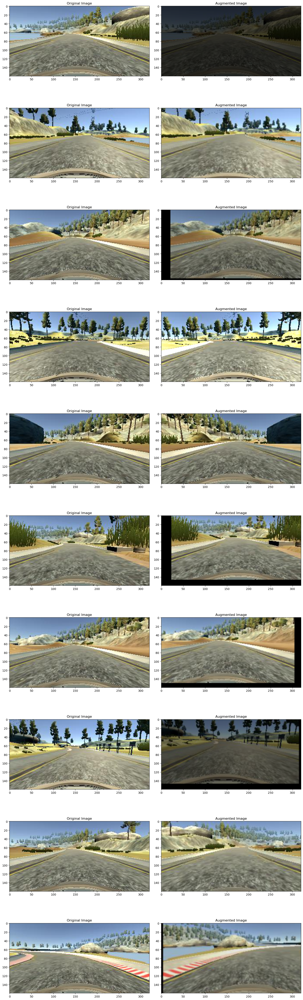

In [141]:
ncol = 2
nrow = 10
 
fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
fig.tight_layout()
 
for i in range(10):
  randnum = random.randint(0, len(image_paths) - 1)
  random_image = image_paths[randnum]
  random_steering = steerings[randnum]
    
  original_image = mpimg.imread(random_image)
  augmented_image, steering = random_augment(random_image, random_steering)
    
  axs[i][0].imshow(original_image)
  axs[i][0].set_title("Original Image")
  
  axs[i][1].imshow(augmented_image)
  axs[i][1].set_title("Augmented Image")

In [142]:
#We remove all uncessary part of the images or features. Ex: the board(tree / forest) or the part of the car
def img_preprocess(img):
  #img = mpimg.imread(img)
  #Crop the uncessary features
  img = img[60:135, :, :]
  #convert image in YUV colorimetry for the Nvidia model
  img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
  #Add a gaussian blur to smoothing the image out and reduce the noise 
  img = cv2.GaussianBlur(img, (3, 3), 0)
  #resize our image
  img = cv2.resize(img, (200, 66))
  #familiar normalization process
  img = img/255
  return img

In [143]:
"""image = image_paths[100]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessing Image')"""

"image = image_paths[100]\noriginal_image = mpimg.imread(image)\npreprocessed_image = img_preprocess(image)\n\nfig, axs = plt.subplots(1, 2, figsize=(15, 10))\nfig.tight_layout()\naxs[0].imshow(original_image)\naxs[0].set_title('Original Image')\naxs[1].imshow(preprocessed_image)\naxs[1].set_title('Preprocessing Image')"

In [144]:
def batch_generator(image_paths, steering_ang, batch_size, istraining):
  
  while True:
    batch_img = []
    batch_steering = []
    
    for i in range(batch_size):
      random_index = random.randint(0, len(image_paths) - 1)
      
      if istraining:
        im, steering = random_augment(image_paths[random_index], steering_ang[random_index])
     
      else:
        im = mpimg.imread(image_paths[random_index])
        steering = steering_ang[random_index]
      
      im = img_preprocess(im)
      batch_img.append(im)
      batch_steering.append(steering)
    yield (np.asarray(batch_img), np.asarray(batch_steering))  

Text(0.5, 1.0, 'Validation Image')

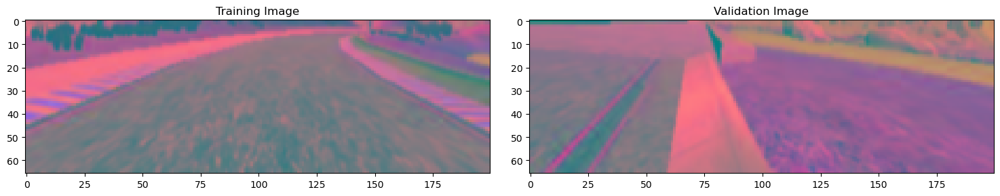

In [145]:
x_train_gen, y_train_gen = next(batch_generator(X_train, Y_train, 1, 1))
x_valid_gen, y_valid_gen = next(batch_generator(X_valid, Y_valid, 1, 0))
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
 
axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')
 
axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation Image')

In [146]:
#We use the NVIDIA model which is efficient for the behavioural cloning and also have to be implemented in the autonomous cars
def nvidia_model():
    model = Sequential()
 
    model.add(Convolution2D(24, kernel_size=(5,5), strides=(2,2), input_shape=(66,200,3),activation='elu'))

    model.add(Convolution2D(36, kernel_size=(5,5), strides=(2,2), activation='elu'))
    model.add(Convolution2D(48, kernel_size=(5,5), strides=(2,2), activation='elu'))
    model.add(Convolution2D(64, kernel_size=(3,3), activation='elu'))
    model.add(Convolution2D(64, kernel_size=(3,3), activation='elu'))
    #model.add(Dropout(0.5))


    model.add(Flatten())
    model.add(Dense(100, activation='elu'))
    #model.add(Dropout(0.5))


    model.add(Dense(50, activation='elu'))
    model.add(Dense(10, activation ='elu'))
    model.add(Dense(1))


    optimizer= Adam(learning_rate=1e-4)
    model.compile(loss='mse', optimizer=optimizer)

    return model




In [147]:
model = nvidia_model()
print(model.summary())

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_15 (Conv2D)          (None, 31, 98, 24)        1824      
                                                                 
 conv2d_16 (Conv2D)          (None, 14, 47, 36)        21636     
                                                                 
 conv2d_17 (Conv2D)          (None, 5, 22, 48)         43248     
                                                                 
 conv2d_18 (Conv2D)          (None, 3, 20, 64)         27712     
                                                                 
 conv2d_19 (Conv2D)          (None, 1, 18, 64)         36928     
                                                                 
 flatten_3 (Flatten)         (None, 1152)              0         
                                                                 
 dense_12 (Dense)            (None, 100)              

In [156]:
history = model.fit_generator(batch_generator(X_train, Y_train, 100, 1),
                                  steps_per_epoch=300, 
                                  epochs=10,
                                  validation_data=batch_generator(X_valid, Y_valid, 100, 0),
                                  validation_steps=200,
                                  verbose=1,
                                  shuffle = 1)

C:\Users\adjoupep\AppData\Local\Temp\ipykernel_6672\1497998210.py:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(batch_generator(X_train, Y_train, 100, 1),


Epoch 1/10
300/300 [==============================] - 255s 850ms/step - loss: 0.0306 - val_loss: 0.0271
Epoch 2/10
300/300 [==============================] - 253s 846ms/step - loss: 0.0297 - val_loss: 0.0273
Epoch 3/10
300/300 [==============================] - 261s 873ms/step - loss: 0.0291 - val_loss: 0.0262
Epoch 4/10
300/300 [==============================] - 250s 834ms/step - loss: 0.0290 - val_loss: 0.0276
Epoch 5/10
300/300 [==============================] - 254s 847ms/step - loss: 0.0279 - val_loss: 0.0247
Epoch 6/10
300/300 [==============================] - 253s 847ms/step - loss: 0.0280 - val_loss: 0.0252
Epoch 7/10
300/300 [==============================] - 280s 934ms/step - loss: 0.0277 - val_loss: 0.0249
Epoch 8/10
300/300 [==============================] - 342s 1s/step - loss: 0.0260 - val_loss: 0.0259
Epoch 9/10
300/300 [==============================] - 343s 1s/step - loss: 0.0254 - val_loss: 0.0247
Epoch 10/10
300/300 [==============================] - 341s 1s/step - 

Text(0.5, 0, 'Epoch')

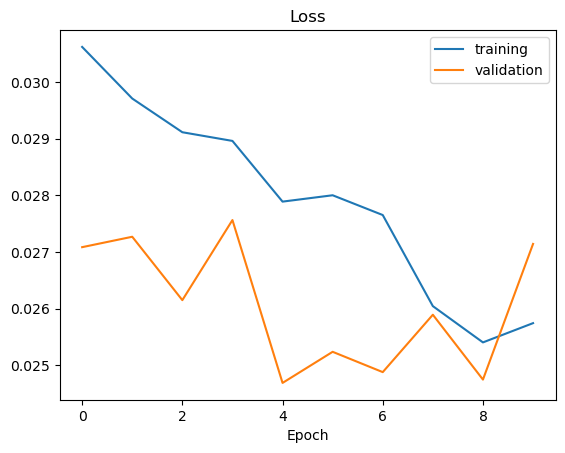

In [157]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'validation'])
plt.title('Loss')
plt.xlabel('Epoch')

#The gap beatween the 2 curves means that the model learns te relations which isn't apply to the validation data
#Cause: we use the relu function activation which return 0 when the input is negatif. So the model can't learn when in this case. We must change the activation function to "elu" which take the negative values

In [158]:
model.save('model2.h5')

In [159]:
from keras.models import load_model
model = load_model('model2.h5')